# Перенос стиля на изображения

## Данные

In [2]:
import os
import time
import datetime
from torch.utils.data import DataLoader, Dataset
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
from torchvision.utils import save_image
from torchvision.utils import make_grid
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
%matplotlib inline

sns.set(style='darkgrid', font_scale=1.2)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [ ]:
# доступ к Гугл-Диску
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Картины Ван Гога
gogh_list = []
for dirname, _, filenames in os.walk('./drive/MyDrive/Colab files/CycleGAN/VincentVanGogh/Saint Remy'):
    for filename in filenames:
        gogh_list.append(os.path.join(dirname, filename))

len(gogh_list)

In [ ]:
# Фотографии природы
landscape_list = []
limit = 5000
i = 0
for dirname, _, filenames in os.walk('./drive/MyDrive/Colab files/CycleGAN/landscape'):
    for filename in filenames:
        i += 1
        landscape_list.append(os.path.join(dirname, filename))
        if i == limit: break

# Это изображение единственное имеет 4 канала
landscape_list.pop(landscape_list.index('./drive/MyDrive/Colab files/CycleGAN/landscape/00000051_(3).jpg'))
len(landscape_list)

4318

In [ ]:
from random import choice

class MyDataset(Dataset):
    """
    Датасет с картинками, который паралельно подгружает их из папок
    производит скалирование и превращение в торчевые тензоры.
    Датасет по индексу позвращает кортеж из двух изображений (тензоров) для каждого
    из двух доментов. Если стоит флаг only_starry_night, то в качестве второго 
    изображения будут возвращаться фрагменты картины "Звездная ночь"
    """
    def __init__(self, x_files, y_files=None, device=device):
        super().__init__()
        self.device = device
        self.x_files = x_files
        self.y_files = y_files
        self.len_ = len(self.x_files)
        self.size = (128, 128)
        
        # Картина "Звездная ночь"
        self.only_starry_night = False
        self.starry_night = Image.open('./van-gogh.png')
        self.starry_night.load()
        self.starry_night = transforms.functional.to_tensor(self.starry_night)
        self.starry_night = transforms.functional.resize(
            self.starry_night, 
            (self.size[0]*5, self.size[1]*5)
        )
        # изображения необходимо скалировать к интервалу [-1, 1] ввиду особенностей
        # генератора (функция активации tanh в самом конце)
        self.starry_night = transforms.functional.normalize(self.starry_night, 0.5, 0.5)
    
    def __len__(self):
        return self.len_
    
    def load_sample(self, file):
        image = Image.open(file)
        image.load()
        return image
    
    def load_van_gogh(self):
        image = Image.open(choice( self.y_files))
        image.load()
        return image
    
    def get_image(self, index, resize=True):
        if resize:
            transform = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize(0.5, 0.5), # скалирование к [-1, 1]
                transforms.Resize(512, 512)
            ])
        else:
            transform = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize(0.5, 0.5), # скалирование к [-1, 1]
            ])
        x = self.load_sample(self.x_files[index])
        x = transform(x)
        return x
  
    def __getitem__(self, index):
        # для преобразования изображений в тензоры PyTorch и нормализации входа
        # датасет выдет сразу два изображения — из первого и второго домена
        # если self.only_starry_night истинно, то вместо разных картин Ван Гога
        # выдаются фрагменты "Звездной Ночи" 
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(0.5, 0.5), # скалирование к [-1, 1]
            transforms.Resize(self.size),
        ])
        x = self.load_sample(self.x_files[index])
        x = transform(x)
        if x.size(0) == 1:
            x = x.expand(3,*x.shape[1:])
        if self.only_starry_night:
            return x, transforms.RandomCrop(self.size)(self.starry_night)
        y = self.load_van_gogh()
        y = transform(y)
        return x, y

In [ ]:
# объект датасета
dataset = MyDataset(landscape_list, gogh_list)
dataset.only_starry_night = True

In [ ]:
batch_size = 16
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

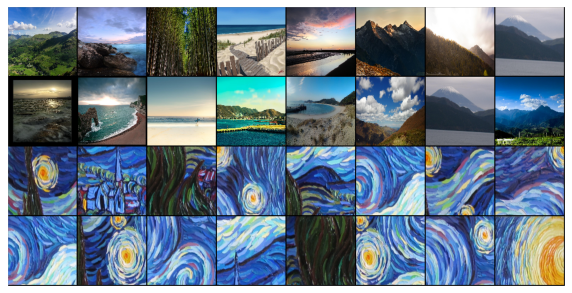

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(images.detach().cpu()[:nmax], normalize=True, nrow=int(nmax**0.5)).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for x, y in dl:
        x = x[:nmax//2]
        y = y[:nmax//2]
        show_images(torch.cat((x, y)), nmax)
        break

show_batch(dataloader, 64)

## CycleGAN

CycleGAN состоит из двух генераторов, каждый из которых учится переводит изображения из одного домена в другой. Для обоих доменов также обучаются два дискриминатора. 

In [23]:
from torchvision.transforms import functional

# Патч-дискриминатор. Смысл в том, что он в конце не сводит входное изображение 
# к одному единственному значению (как в случае обычного дискриминатора)
# а к карте признаков, в которой каждый пиксель охватывает часть изначального 
# изображения. Лосс-фукнция будет применяться к каждому пикселю, после чего будет
# получен средний результат
class PathDiscriminator(nn.Module):
    def __init__(
        self,
        in_channels: int = 3,
        out_channels: int = 1,
        channels: int = 64,
        image_size: int = 70,
    ) -> None:
        super(PathDiscriminator, self).__init__()
        self.image_size = image_size

        self.main = nn.Sequential(
            nn.Conv2d(in_channels, channels, (4, 4), (2, 2), (1, 1)),
            nn.LeakyReLU(0.2, True),
            nn.Conv2d(channels, int(channels * 2), (4, 4), (2, 2), (1, 1)),
            nn.InstanceNorm2d(int(channels * 2)),
            nn.LeakyReLU(0.2, True),
            nn.Conv2d(int(channels * 2), int(channels * 4), (4, 4), (2, 2), (1, 1)),
            nn.InstanceNorm2d(int(channels * 4)),
            nn.LeakyReLU(0.2, True),
            nn.Conv2d(int(channels * 4), int(channels * 8), (4, 4), (1, 1), (1, 1)),
            nn.InstanceNorm2d(int(channels * 8)),
            nn.LeakyReLU(0.2, True),
            nn.Conv2d(int(channels * 8), out_channels, (4, 4), (1, 1), (1, 1)),
        )

    def forward(self, x):
        x = self.main(x)
        x = torch.nn.functional.avg_pool2d(x, x.size()[2:])
        x = torch.flatten(x, 1)
        return x


# Генератор
class CycleNet(nn.Module):
    def __init__(
        self,
        in_channels: int = 3,
        out_channels: int = 3,
        channels: int = 64,
    ) -> None:
        super(CycleNet, self).__init__()
        self.main = nn.Sequential(
            # Initial convolution block
            nn.ReflectionPad2d(3),
            nn.Conv2d(in_channels, channels, (7, 7), (1, 1), (0, 0)),
            nn.InstanceNorm2d(channels),
            nn.ReLU(True),
            # Downsampling
            nn.Conv2d(channels, int(channels * 2), (3, 3), (2, 2), (1, 1)),
            nn.InstanceNorm2d(int(channels * 2)),
            nn.ReLU(True),
            nn.Conv2d(int(channels * 2), int(channels * 4), (3, 3), (2, 2), (1, 1)),
            nn.InstanceNorm2d(int(channels * 4)),
            nn.ReLU(True),
            # Residual blocks
            _ResidualBlock(int(channels * 4)),
            _ResidualBlock(int(channels * 4)),
            _ResidualBlock(int(channels * 4)),
            _ResidualBlock(int(channels * 4)),
            _ResidualBlock(int(channels * 4)),
            _ResidualBlock(int(channels * 4)),
            _ResidualBlock(int(channels * 4)),
            _ResidualBlock(int(channels * 4)),
            _ResidualBlock(int(channels * 4)),
            # Upsampling
            nn.ConvTranspose2d(
                int(channels * 4), int(channels * 2), (3, 3), (2, 2), (1, 1), (1, 1)
            ),
            nn.InstanceNorm2d(int(channels * 2)),
            nn.ReLU(True),
            nn.ConvTranspose2d(
                int(channels * 2), channels, (3, 3), (2, 2), (1, 1), (1, 1)
            ),
            nn.InstanceNorm2d(channels),
            nn.ReLU(True),
            # Output layer
            nn.ReflectionPad2d(3),
            nn.Conv2d(channels, out_channels, (7, 7), (1, 1), (0, 0)),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.main(x)
        return x

# Остаточный блок. Играет роль бутылочного горлышка. Не меняет размер карт признаков
class _ResidualBlock(nn.Module):
    def __init__(self, channels: int):
        super(_ResidualBlock, self).__init__()

        self.res = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(channels, channels, (3, 3), (1, 1), (0, 0)),
            nn.InstanceNorm2d(channels),
            nn.ReLU(True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(channels, channels, (3, 3), (1, 1), (0, 0)),
            nn.InstanceNorm2d(channels),
        )

    def forward(self, x):
        identity = x
        x = self.res(x)
        x = torch.add(x, identity)

        return x


In [ ]:
# Модель и изображения занимают очень много места, поэтому нужно переодически 
# подчищать память
import gc
try:
    del G_AB, G_BA, D_A, D_B, optimizer_G_AB, optimizer_G_BA, optimizer_D_A, optimizer_D_B, real_A, real_B, fake_A, fake_B
except:
    pass
gc.collect(), torch.cuda.empty_cache()

(6830, None)

[Epoch 0/100] [Batch 0/270] [D loss: 0.814771] [G loss: 17.336678, adv: 1.533945, cycle: 1.053967] ETA: 12:47:50.956707
[Epoch 0/100] [Batch 50/270] [D loss: 1.944564] [G loss: 14.541332, adv: 3.998488, cycle: 0.718630] ETA: 12:51:23.835614
[Epoch 0/100] [Batch 100/270] [D loss: 0.162457] [G loss: 11.240464, adv: 0.970762, cycle: 0.703896] ETA: 13:07:48.224716
[Epoch 0/100] [Batch 150/270] [D loss: 0.254276] [G loss: 9.433971, adv: 0.900342, cycle: 0.585662] ETA: 12:57:09.878032
[Epoch 0/100] [Batch 200/270] [D loss: 0.228950] [G loss: 10.090274, adv: 1.116421, cycle: 0.610675] ETA: 12:26:04.468288
[Epoch 0/100] [Batch 250/270] [D loss: 0.195073] [G loss: 8.696054, adv: 1.338231, cycle: 0.504897] ETA: 12:34:32.432864


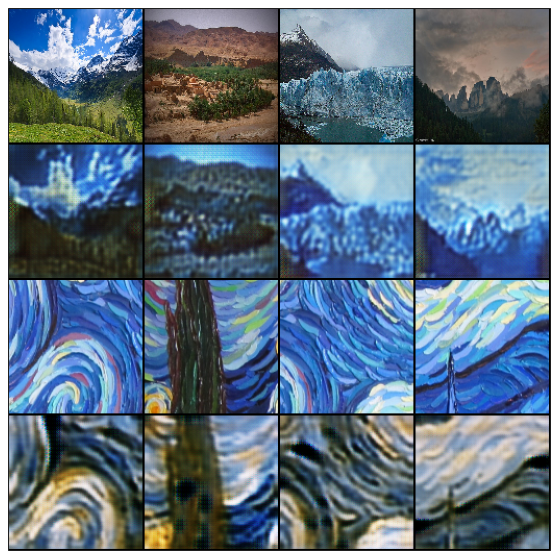

[Epoch 1/100] [Batch 0/270] [D loss: 0.398526] [G loss: 7.442255, adv: 1.245175, cycle: 0.433270] ETA: 16:44:27.141738
[Epoch 1/100] [Batch 50/270] [D loss: 0.160125] [G loss: 8.807916, adv: 1.646134, cycle: 0.494159] ETA: 12:38:06.891727
[Epoch 1/100] [Batch 100/270] [D loss: 0.207545] [G loss: 8.279177, adv: 1.484230, cycle: 0.468177] ETA: 12:20:05.887406
[Epoch 1/100] [Batch 150/270] [D loss: 0.312718] [G loss: 8.844921, adv: 1.344999, cycle: 0.535232] ETA: 12:23:36.999822
[Epoch 1/100] [Batch 200/270] [D loss: 0.249325] [G loss: 7.613142, adv: 1.351770, cycle: 0.424453] ETA: 12:34:45.122819
[Epoch 1/100] [Batch 250/270] [D loss: 0.237658] [G loss: 6.730930, adv: 0.965366, cycle: 0.390510] ETA: 12:55:03.773937


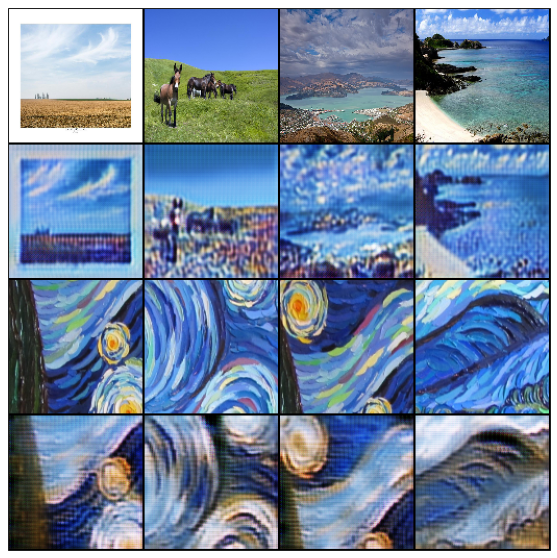

[Epoch 2/100] [Batch 0/270] [D loss: 0.313477] [G loss: 8.249764, adv: 2.162234, cycle: 0.418894] ETA: 16:57:42.181449
[Epoch 2/100] [Batch 50/270] [D loss: 0.390161] [G loss: 8.219155, adv: 1.554074, cycle: 0.458118] ETA: 12:14:14.070776
[Epoch 2/100] [Batch 100/270] [D loss: 0.344390] [G loss: 7.175753, adv: 0.952631, cycle: 0.424553] ETA: 12:34:20.937214
[Epoch 2/100] [Batch 150/270] [D loss: 0.257319] [G loss: 8.314766, adv: 2.536008, cycle: 0.396296] ETA: 12:26:09.737792
[Epoch 2/100] [Batch 200/270] [D loss: 0.111286] [G loss: 8.419231, adv: 1.339719, cycle: 0.502004] ETA: 11:55:37.710533
[Epoch 2/100] [Batch 250/270] [D loss: 0.369645] [G loss: 6.685915, adv: 0.499219, cycle: 0.428086] ETA: 12:49:18.238692


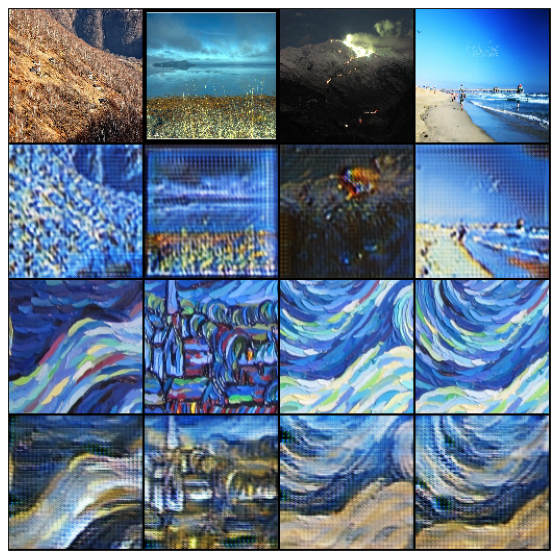

[Epoch 3/100] [Batch 0/270] [D loss: 0.238694] [G loss: 7.929171, adv: 1.329700, cycle: 0.452335] ETA: 17:05:15.863543
[Epoch 3/100] [Batch 50/270] [D loss: 0.232994] [G loss: 6.550117, adv: 0.857647, cycle: 0.391654] ETA: 12:56:38.065743
[Epoch 3/100] [Batch 100/270] [D loss: 0.279531] [G loss: 7.388647, adv: 1.930798, cycle: 0.375896] ETA: 12:01:38.560185
[Epoch 3/100] [Batch 150/270] [D loss: 0.133302] [G loss: 8.472986, adv: 1.600079, cycle: 0.482232] ETA: 12:23:58.395567
[Epoch 3/100] [Batch 200/270] [D loss: 0.167614] [G loss: 7.377146, adv: 1.833280, cycle: 0.383010] ETA: 12:40:59.670296
[Epoch 3/100] [Batch 250/270] [D loss: 2.846831] [G loss: 10.856199, adv: 4.587070, cycle: 0.429406] ETA: 11:59:36.171341


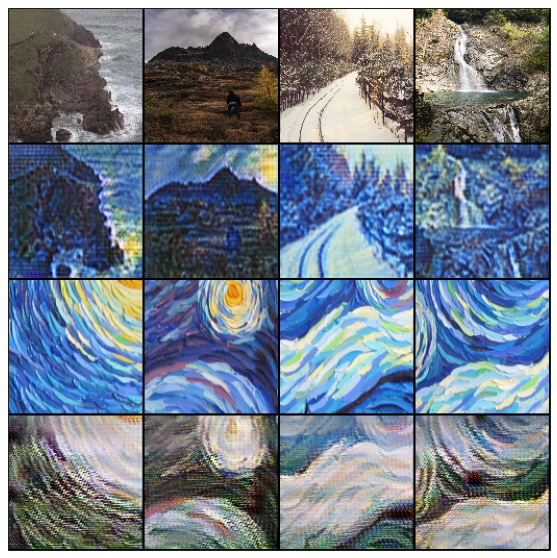

[Epoch 4/100] [Batch 0/270] [D loss: 0.423503] [G loss: 5.905031, adv: 0.855589, cycle: 0.345516] ETA: 16:20:02.970657
[Epoch 4/100] [Batch 50/270] [D loss: 0.364632] [G loss: 5.982140, adv: 1.081269, cycle: 0.339212] ETA: 12:07:54.289031
[Epoch 4/100] [Batch 100/270] [D loss: 0.321719] [G loss: 5.987162, adv: 1.195508, cycle: 0.324071] ETA: 12:31:09.353991
[Epoch 4/100] [Batch 150/270] [D loss: 0.366280] [G loss: 6.461385, adv: 1.499213, cycle: 0.339840] ETA: 12:09:43.693900
[Epoch 4/100] [Batch 200/270] [D loss: 0.207406] [G loss: 6.572572, adv: 1.463489, cycle: 0.355451] ETA: 11:49:15.457191
[Epoch 4/100] [Batch 250/270] [D loss: 0.293002] [G loss: 6.630054, adv: 1.004609, cycle: 0.387542] ETA: 12:13:25.087402


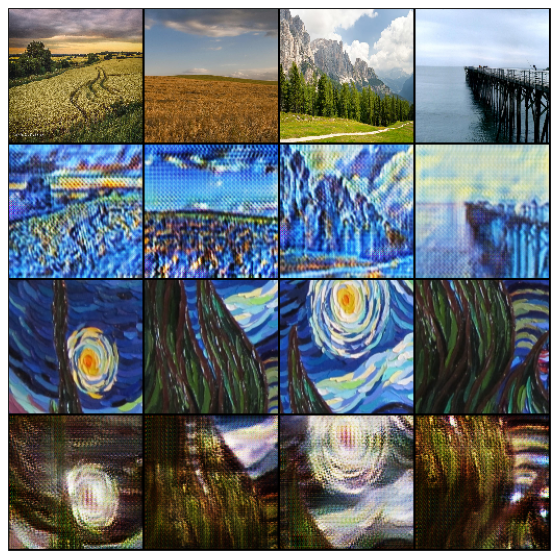

[Epoch 5/100] [Batch 0/270] [D loss: 0.993065] [G loss: 5.680514, adv: 0.376636, cycle: 0.368811] ETA: 16:04:01.810906
[Epoch 5/100] [Batch 50/270] [D loss: 0.527574] [G loss: 7.679010, adv: 1.994144, cycle: 0.408556] ETA: 12:13:58.232422
[Epoch 5/100] [Batch 100/270] [D loss: 0.416224] [G loss: 7.178817, adv: 1.368555, cycle: 0.424128] ETA: 12:03:16.069837
[Epoch 5/100] [Batch 150/270] [D loss: 0.104107] [G loss: 7.362766, adv: 1.498105, cycle: 0.411599] ETA: 11:56:59.558787
[Epoch 5/100] [Batch 200/270] [D loss: 0.211732] [G loss: 6.153688, adv: 1.363806, cycle: 0.330501] ETA: 12:04:52.572284
[Epoch 5/100] [Batch 250/270] [D loss: 0.457558] [G loss: 8.670250, adv: 2.133137, cycle: 0.458035] ETA: 12:17:43.129139


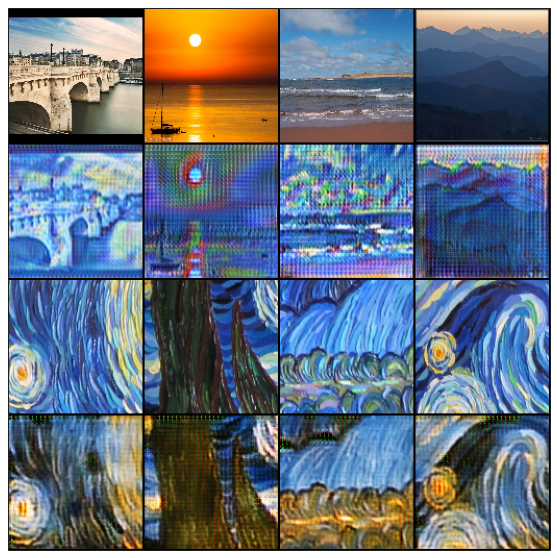

[Epoch 6/100] [Batch 0/270] [D loss: 0.277786] [G loss: 6.292891, adv: 0.780366, cycle: 0.374916] ETA: 15:27:40.217814
[Epoch 6/100] [Batch 50/270] [D loss: 0.283310] [G loss: 6.790136, adv: 1.366604, cycle: 0.378206] ETA: 11:04:18.866622
[Epoch 6/100] [Batch 100/270] [D loss: 0.459426] [G loss: 6.255225, adv: 0.592503, cycle: 0.389512] ETA: 11:50:45.902328
[Epoch 6/100] [Batch 150/270] [D loss: 0.380478] [G loss: 5.169353, adv: 0.967260, cycle: 0.294354] ETA: 12:10:50.880790
[Epoch 6/100] [Batch 200/270] [D loss: 0.290936] [G loss: 6.087787, adv: 0.758760, cycle: 0.378930] ETA: 11:45:01.873384
[Epoch 6/100] [Batch 250/270] [D loss: 0.363725] [G loss: 5.197846, adv: 0.690750, cycle: 0.316272] ETA: 11:16:07.161598


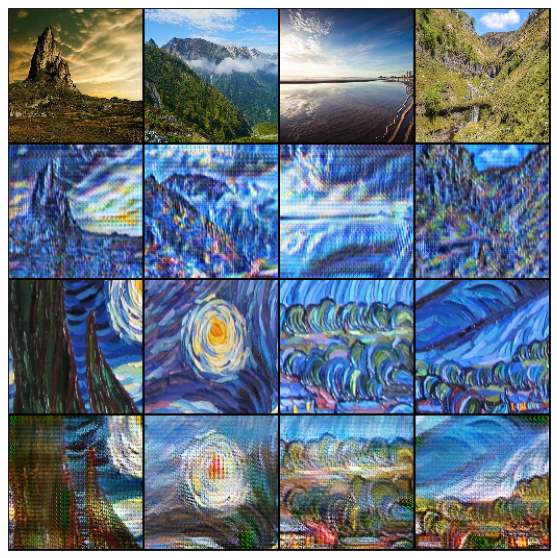

[Epoch 7/100] [Batch 0/270] [D loss: 0.283958] [G loss: 5.980096, adv: 1.121610, cycle: 0.334348] ETA: 16:00:37.497582
[Epoch 7/100] [Batch 50/270] [D loss: 0.354423] [G loss: 5.991714, adv: 1.688708, cycle: 0.295696] ETA: 11:56:21.530509
[Epoch 7/100] [Batch 100/270] [D loss: 0.323055] [G loss: 5.548644, adv: 1.095799, cycle: 0.308219] ETA: 11:19:12.236502
[Epoch 7/100] [Batch 150/270] [D loss: 0.295700] [G loss: 6.100019, adv: 0.967475, cycle: 0.362013] ETA: 11:26:58.529663
[Epoch 7/100] [Batch 200/270] [D loss: 0.278111] [G loss: 6.489996, adv: 1.498343, cycle: 0.341857] ETA: 11:43:14.327140
[Epoch 7/100] [Batch 250/270] [D loss: 0.358436] [G loss: 5.640472, adv: 0.828435, cycle: 0.341473] ETA: 12:33:18.724060


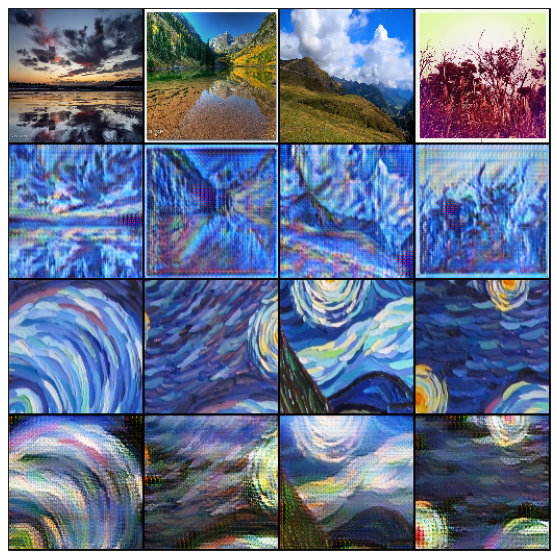

[Epoch 8/100] [Batch 0/270] [D loss: 0.245389] [G loss: 5.710669, adv: 0.939628, cycle: 0.334162] ETA: 15:41:38.950453
[Epoch 8/100] [Batch 50/270] [D loss: 0.255470] [G loss: 5.831551, adv: 1.639379, cycle: 0.285755] ETA: 11:21:22.148101
[Epoch 8/100] [Batch 100/270] [D loss: 0.221726] [G loss: 5.855042, adv: 1.549815, cycle: 0.299655] ETA: 11:27:12.143807
[Epoch 8/100] [Batch 150/270] [D loss: 0.174766] [G loss: 6.594016, adv: 1.509971, cycle: 0.353480] ETA: 12:05:55.907514
[Epoch 8/100] [Batch 200/270] [D loss: 0.156496] [G loss: 6.087199, adv: 1.377990, cycle: 0.331527] ETA: 11:45:30.290604
[Epoch 8/100] [Batch 250/270] [D loss: 0.116161] [G loss: 5.559169, adv: 1.451172, cycle: 0.292828] ETA: 12:08:18.979061


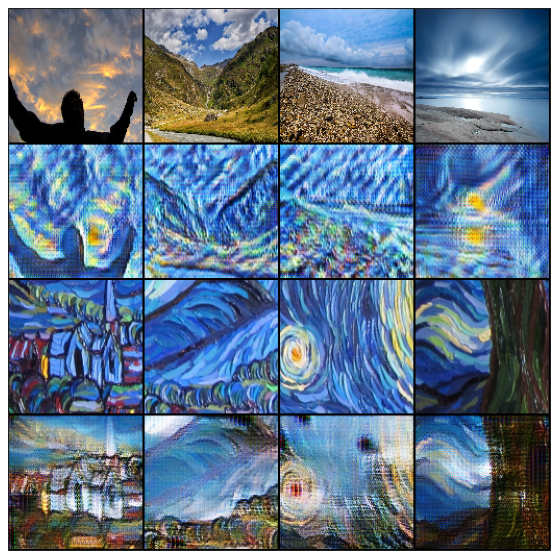

[Epoch 9/100] [Batch 0/270] [D loss: 0.164272] [G loss: 5.437372, adv: 1.177223, cycle: 0.303320] ETA: 14:59:21.439791
[Epoch 9/100] [Batch 50/270] [D loss: 0.238001] [G loss: 6.264989, adv: 1.726277, cycle: 0.311019] ETA: 11:55:26.579323
[Epoch 9/100] [Batch 100/270] [D loss: 0.373628] [G loss: 4.994602, adv: 0.591850, cycle: 0.305923] ETA: 11:41:03.734114
[Epoch 9/100] [Batch 150/270] [D loss: 0.286859] [G loss: 6.092477, adv: 1.309258, cycle: 0.338904] ETA: 11:51:18.635459
[Epoch 9/100] [Batch 200/270] [D loss: 0.280142] [G loss: 5.022146, adv: 0.948233, cycle: 0.287225] ETA: 11:31:19.718928
[Epoch 9/100] [Batch 250/270] [D loss: 0.297002] [G loss: 5.806564, adv: 1.638356, cycle: 0.293048] ETA: 11:10:07.984619


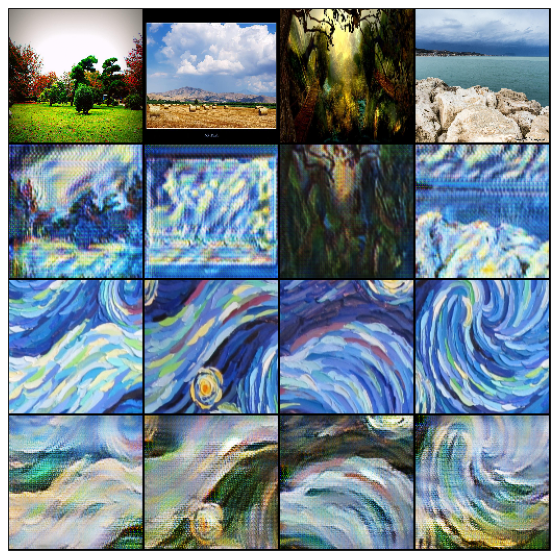

[Epoch 10/100] [Batch 0/270] [D loss: 0.324550] [G loss: 6.555890, adv: 1.992642, cycle: 0.320153] ETA: 15:29:48.819909
[Epoch 10/100] [Batch 50/270] [D loss: 0.261538] [G loss: 5.397845, adv: 0.913157, cycle: 0.311753] ETA: 11:27:37.332146
[Epoch 10/100] [Batch 100/270] [D loss: 0.265354] [G loss: 5.863646, adv: 1.201479, cycle: 0.341263] ETA: 10:53:00.191326
[Epoch 10/100] [Batch 150/270] [D loss: 0.318459] [G loss: 5.628410, adv: 1.434967, cycle: 0.290788] ETA: 10:59:57.337031
[Epoch 10/100] [Batch 200/270] [D loss: 0.344436] [G loss: 5.066937, adv: 1.107358, cycle: 0.272705] ETA: 11:56:21.860542
[Epoch 10/100] [Batch 250/270] [D loss: 0.240332] [G loss: 4.882505, adv: 0.988654, cycle: 0.276504] ETA: 11:20:08.905673


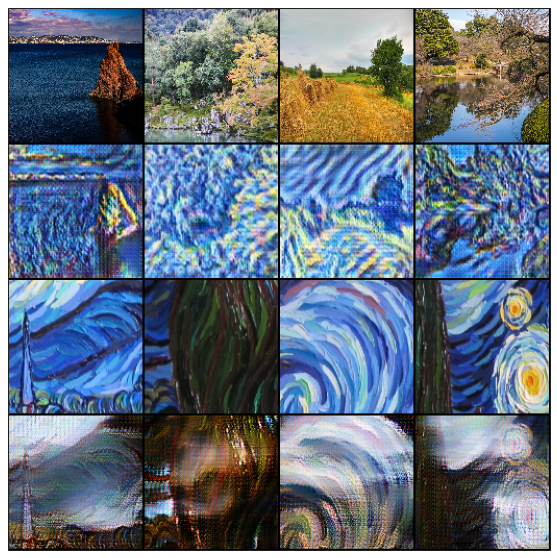

[Epoch 11/100] [Batch 0/270] [D loss: 0.270544] [G loss: 5.642339, adv: 1.120694, cycle: 0.326327] ETA: 15:06:42.726860
[Epoch 11/100] [Batch 50/270] [D loss: 0.580332] [G loss: 7.105873, adv: 2.825077, cycle: 0.299420] ETA: 11:13:19.546523
[Epoch 11/100] [Batch 100/270] [D loss: 0.141320] [G loss: 5.383705, adv: 1.468965, cycle: 0.275326] ETA: 11:22:23.504598
[Epoch 11/100] [Batch 150/270] [D loss: 0.319946] [G loss: 5.652558, adv: 1.092503, cycle: 0.316306] ETA: 11:24:04.137154
[Epoch 11/100] [Batch 200/270] [D loss: 0.270058] [G loss: 5.475714, adv: 0.945246, cycle: 0.316094] ETA: 11:14:31.764596
[Epoch 11/100] [Batch 250/270] [D loss: 0.195922] [G loss: 6.032793, adv: 1.873276, cycle: 0.295621] ETA: 11:13:41.493807


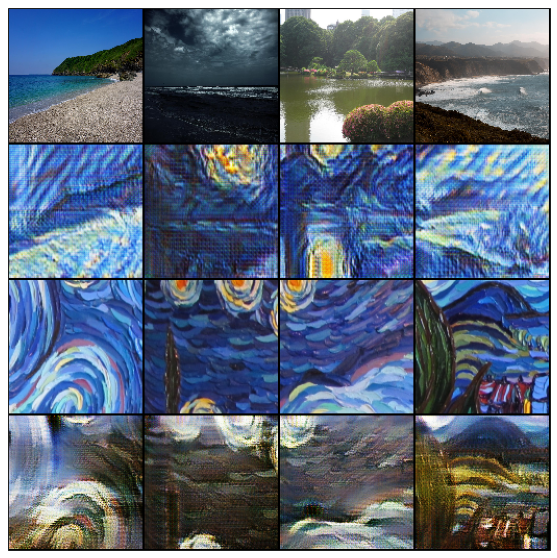

[Epoch 12/100] [Batch 0/270] [D loss: 0.173120] [G loss: 5.116085, adv: 1.516188, cycle: 0.251506] ETA: 14:19:51.445999
[Epoch 12/100] [Batch 50/270] [D loss: 0.229844] [G loss: 5.810808, adv: 1.725703, cycle: 0.286705] ETA: 11:30:18.283017
[Epoch 12/100] [Batch 100/270] [D loss: 0.537996] [G loss: 8.854792, adv: 1.764983, cycle: 0.520088] ETA: 11:09:11.894984
[Epoch 12/100] [Batch 150/270] [D loss: 0.291584] [G loss: 5.608510, adv: 0.819797, cycle: 0.332765] ETA: 11:18:09.808853
[Epoch 12/100] [Batch 200/270] [D loss: 0.281054] [G loss: 5.428007, adv: 1.228736, cycle: 0.295674] ETA: 10:42:02.801695
[Epoch 12/100] [Batch 250/270] [D loss: 0.189749] [G loss: 5.484723, adv: 1.169624, cycle: 0.304899] ETA: 10:58:08.214371


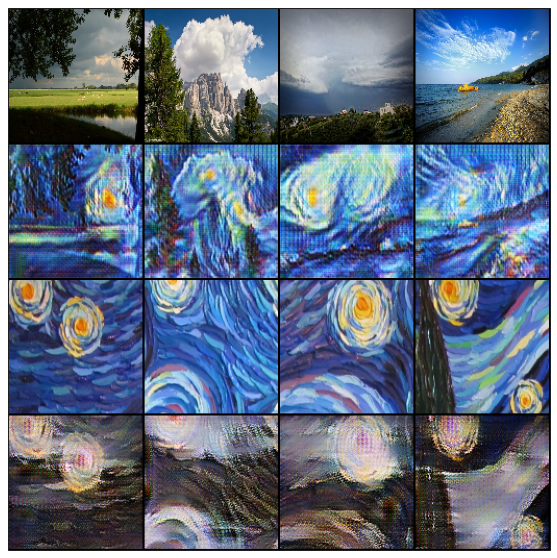

[Epoch 13/100] [Batch 0/270] [D loss: 0.286141] [G loss: 5.692933, adv: 1.582195, cycle: 0.287542] ETA: 14:52:31.464465
[Epoch 13/100] [Batch 50/270] [D loss: 0.134207] [G loss: 5.469602, adv: 1.417366, cycle: 0.287159] ETA: 10:58:42.620049
[Epoch 13/100] [Batch 100/270] [D loss: 0.200935] [G loss: 5.867167, adv: 1.850444, cycle: 0.280674] ETA: 11:01:55.533006
[Epoch 13/100] [Batch 150/270] [D loss: 0.210422] [G loss: 4.918817, adv: 1.208722, cycle: 0.265379] ETA: 11:00:09.405184
[Epoch 13/100] [Batch 200/270] [D loss: 0.299672] [G loss: 5.192168, adv: 0.881132, cycle: 0.309818] ETA: 11:08:54.612617
[Epoch 13/100] [Batch 250/270] [D loss: 0.374570] [G loss: 4.565900, adv: 0.912208, cycle: 0.259806] ETA: 10:53:42.869081


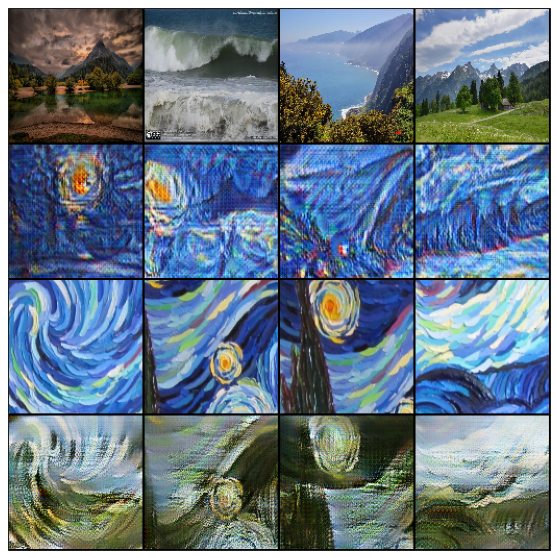

[Epoch 14/100] [Batch 0/270] [D loss: 0.193684] [G loss: 5.188539, adv: 1.148866, cycle: 0.295297] ETA: 14:38:22.274623
[Epoch 14/100] [Batch 50/270] [D loss: 0.300772] [G loss: 5.792227, adv: 1.177939, cycle: 0.320547] ETA: 11:24:15.369034
[Epoch 14/100] [Batch 100/270] [D loss: 0.226144] [G loss: 5.517828, adv: 1.486995, cycle: 0.283067] ETA: 10:40:11.806870


In [ ]:
# Losses
# Функция потерь дискриминатора
adversarial_loss = torch.nn.MSELoss()
# Функция потерь между изображением из одного домена и им же, но пройденным 
# через оба генератора (A->B`->A``)
cycle_loss = torch.nn.L1Loss()
# Функция потерь между изображенем из одного домена и им же, но пройденым через
# генератор, который переводит изображения в тот же домен 
identity_loss = torch.nn.MSELoss()

# Initialize generator and discriminator
G_AB = CycleNet().to(device)
G_BA = CycleNet().to(device)
D_A = PathDiscriminator().to(device)
D_B = PathDiscriminator().to(device)

# Optimizers
optimizer_G_AB = torch.optim.Adam(G_AB.parameters(), betas=(0.5, 0.999))
optimizer_G_BA = torch.optim.Adam(G_BA.parameters(), betas=(0.5, 0.999))

optimizer_D_A = torch.optim.Adam(D_A.parameters(), betas=(0.5, 0.999))
optimizer_D_B = torch.optim.Adam(D_B.parameters(), betas=(0.5, 0.999))

# ----------
#  Training
# ----------
n_epochs = 100
prev_time = time.time()

valid = torch.ones(1).to(device)
fake = torch.zeros(1).to(device)

D_A.train()
D_B.train()
G_AB.train()
G_BA.train()

for epoch in range(n_epochs):
    for i, (real_A, real_B) in enumerate(dataloader):
        # очистка памяти
        gc.collect(), torch.cuda.empty_cache()
        # realA - пейзажи, real_B - Ван Гог
        real_A = real_A.to(device)
        real_B = real_B.to(device)

        # ------------------
        #  Train Generators
        # ------------------
        optimizer_G_AB.zero_grad()
        optimizer_G_BA.zero_grad()

        # GAN loss
        fake_B = G_AB(real_A)
        loss_GAN_AB = adversarial_loss(D_B(fake_B), valid)
        fake_A = G_BA(real_B)
        loss_GAN_BA = adversarial_loss(D_A(fake_A), valid)
        loss_GAN = loss_GAN_AB + loss_GAN_BA
        # очистка памяти
        gc.collect(), torch.cuda.empty_cache()

        # Cycle loss
        loss_cycle_A = cycle_loss(G_BA(fake_B), real_A)
        loss_cycle_B = cycle_loss(G_AB(fake_A), real_B)
        loss_cycle = loss_cycle_A + loss_cycle_B

        # Identity Loss
        idn_loss = identity_loss(G_AB(real_B), real_B) + identity_loss(G_BA(real_A), real_A)
        # очистка памяти
        gc.collect(), torch.cuda.empty_cache()

        # Total loss
        loss_G = loss_GAN + 10.0 * loss_cycle + 5.0 * idn_loss
        loss_G.backward()
        optimizer_G_AB.step()
        optimizer_G_BA.step()

        # -----------------------
        #  Train Discriminator A
        # -----------------------
        optimizer_D_A.zero_grad()
        # Real loss
        loss_real = adversarial_loss(D_A(real_A), valid)
        # Fake loss (on batch of previously generated samples)
        loss_fake = adversarial_loss(D_A(fake_A.detach()), fake)
        # Total loss
        loss_D_A = (loss_real + loss_fake) / 2
        loss_D_A.backward()
        optimizer_D_A.step()
        # очистка памяти
        gc.collect(), torch.cuda.empty_cache()

        # -----------------------
        #  Train Discriminator B
        # -----------------------
        optimizer_D_B.zero_grad()
        # Real loss
        loss_real = adversarial_loss(D_B(real_B), valid)
        # Fake loss (on batch of previously generated samples)
        loss_fake = adversarial_loss(D_B(fake_B.detach()), fake)
        # Total loss
        loss_D_B = (loss_real + loss_fake) / 2
        loss_D_B.backward()
        optimizer_D_B.step()
        loss_D = loss_D_A + loss_D_B
        # очистка памяти
        gc.collect(), torch.cuda.empty_cache()

        # --------------
        #  Log Progress
        # --------------
        # Determine approximate time left
        batches_done = epoch * len(dataloader) + i
        batches_left = n_epochs * len(dataloader) - batches_done
        time_left = datetime.timedelta(seconds=batches_left * (time.time() - prev_time))
        prev_time = time.time()

        # Print log
        if i % 50 == 0:
            print(
                "\r[Epoch %d/%d] [Batch %d/%d] [D loss: %f] \
                [G loss: %f, adv: %f, cycle: %f] ETA: %s"
                % (
                    epoch,
                    n_epochs,
                    i,
                    len(dataloader),
                    loss_D.item(),
                    loss_G.item(),
                    loss_GAN.item(),
                    loss_cycle.item(),
                    time_left,
                )
            )
    # If at sample interval save image
    show_images(
        torch.cat((real_A[:4], G_AB(real_A)[:4], real_B[:4], G_BA(real_B)[:4])), nmax=16
    )
    plt.show()
    torch.save(
        G_AB.state_dict(),
        f"./drive/MyDrive/Colab files/CycleGAN/models/G_AB_{epoch}.pth",
    )


In [ ]:
# сохраняем веса
!mkdir ./CycleGAN
torch.save(G_AB.state_dict(), "./CycleGAN/G_AB.pth")
torch.save(G_BA.state_dict(), "./CycleGAN/G_BA.pth")
torch.save(D_A.state_dict(), "./CycleGAN/D_A.pth")
torch.save(D_B.state_dict(), "./CycleGAN/D_B.pth")

In [ ]:
# вывод изображений
for a, b in dataloader:
    show_images(a[:5])
    show_images(G_AB(a.to(device)[:5]).detach().cpu())
    break

In [ ]:
# вывод изображений
for a, b in dataloader:
    show_images(b)
    show_images(G_BA(b.to(device)).detach().cpu())
    break

In [ ]:
image = dataset.get_image(1, resize=False).to(device)
image = image.unsqueeze(0)
print(image.size())
image = G_AB(image)
show_images(image)

Обучение требует большого количества времени, но даже так изображения выглядят несколько "поврежденными". Возможно, стоит повозиться с гипер-параметрами, архитектурой и тренировочным датасетом.

# Neural-Style algorithm

https://arxiv.org/abs/1508.06576

Особенностью данного метода является то, что изменяется не параметры модели, а само входное изображение. Благодаря этому, не требуется обучать модель на какой-то конкретный стиль -- она может работать с любым. Минусом данного метода является то, что каждое входное изображение проходит обработку, что сказывается на скорости работы. 

Building the style transfer model..
Optimizing..


<ipython-input-6-0c3e5c89ebcc>:103: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1)
<ipython-input-6-0c3e5c89ebcc>:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1)


run [50]:
Style Loss : 42.409275 Content Loss: 36.584965

run [100]:
Style Loss : 7.352501 Content Loss: 33.424438

run [150]:
Style Loss : 2.492502 Content Loss: 30.271767

run [200]:
Style Loss : 1.664404 Content Loss: 28.196835

run [250]:
Style Loss : 1.489471 Content Loss: 26.694351

run [300]:
Style Loss : 1.334682 Content Loss: 25.765034



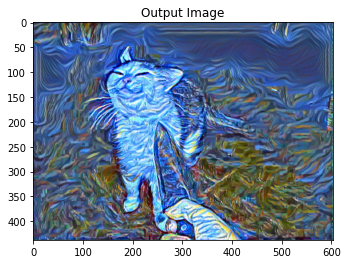

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.transforms.functional import to_pil_image

import copy

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# desired size of the output image
imsize = 512 if torch.cuda.is_available() else 128  # use small size if no gpu


def image_loader(image_name, imsize=None):
    if imsize is None:
        loader = transforms.Compose([transforms.ToTensor()])
    else:
        loader = transforms.Compose(
            [transforms.Resize(imsize), transforms.ToTensor()]  # scale imported image
        )
    image = Image.open(image_name)
    # fake batch dimension required to fit network's input dimensions
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)


content_img = image_loader("./cat.png")
style_img = image_loader("./starry_night.png", content_img.size()[2:])

assert (
    style_img.size() == content_img.size()
), f"Изображения должны быть равными: {style_img.size()}, {content_img.size()}"

unloader = transforms.ToPILImage()  # reconvert into PIL image


def imshow(tensor, title=None):
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)  # remove the fake batch dimension
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


class ContentLoss(nn.Module):
    def __init__(
        self,
        target,
    ):
        super(ContentLoss, self).__init__()
        # we 'detach' the target content from the tree used
        # to dynamically compute the gradient: this is a stated value,
        # not a variable. Otherwise the forward method of the criterion
        # will throw an error.
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input


def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resise F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)


class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input


cnn = models.vgg19(pretrained=True).features.to(device).eval()

cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

# create a module to normalize input image so we can easily put it in a
# nn.Sequential
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view the mean and std to make them [C x 1 x 1] so that they can
        # directly work with image Tensor of shape [B x C x H x W].
        # B is batch size. C is number of channels. H is height and W is width.
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize img
        return (img - self.mean) / self.std


# desired depth layers to compute style/content losses :
content_layers_default = ["conv_4"]
style_layers_default = ["conv_1", "conv_2", "conv_3", "conv_4", "conv_5"]


def get_style_model_and_losses(
    cnn,
    normalization_mean,
    normalization_std,
    style_img,
    content_img,
    content_layers=content_layers_default,
    style_layers=style_layers_default,
):
    # normalization module
    normalization = Normalization(normalization_mean, normalization_std).to(device)

    # just in order to have an iterable access to or list of content/syle
    # losses
    content_losses = []
    style_losses = []

    # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = "conv_{}".format(i)
        elif isinstance(layer, nn.ReLU):
            name = "relu_{}".format(i)
            # The in-place version doesn't play very nicely with the ContentLoss
            # and StyleLoss we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = "pool_{}".format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = "bn_{}".format(i)
        else:
            raise RuntimeError(
                "Unrecognized layer: {}".format(layer.__class__.__name__)
            )

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break
    model = model[: (i + 1)]
    return model, style_losses, content_losses


input_img = content_img.clone()
# if you want to use white noise instead uncomment the below line:
# input_img = torch.randn(content_img.data.size(), device=device)

# add the original input image to the figure:
# imshow(input_img, title='Input Image')


def get_input_optimizer(input_img):
    # this line to show that input is a parameter that requires a gradient
    optimizer = optim.LBFGS([input_img])
    return optimizer


def run_style_transfer(
    cnn,
    normalization_mean,
    normalization_std,
    content_img,
    style_img,
    input_img,
    num_steps=500,
    style_weight=1000000,
    content_weight=1,
):
    """Run the style transfer."""
    print("Building the style transfer model..")
    model, style_losses, content_losses = get_style_model_and_losses(
        cnn, normalization_mean, normalization_std, style_img, content_img
    )

    # We want to optimize the input and not the model parameters so we
    # update all the requires_grad fields accordingly
    input_img.requires_grad_(True)
    model.requires_grad_(False)

    optimizer = get_input_optimizer(input_img)

    print("Optimizing..")
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                print(
                    "Style Loss : {:4f} Content Loss: {:4f}".format(
                        style_score.item(), content_score.item()
                    )
                )
                print()

            return style_score + content_score

        optimizer.step(closure)

    # a last correction...
    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img


def main():
    output = run_style_transfer(
        cnn,
        cnn_normalization_mean,
        cnn_normalization_std,
        content_img,
        style_img,
        input_img,
        num_steps=300,
        style_weight=100000,
    )

    img = to_pil_image(output.squeeze(0))
    img.save("output.png")

    imshow(output, title="Output Image")

    # sphinx_gallery_thumbnail_number = 4
    plt.show()


main()


# Multy-Style Generative Network

Предобученная сеть, основанная на работе https://arxiv.org/abs/1703.06953.


Код взят из Github репозитория https://github.com/zhanghang1989/PyTorch-Multi-Style-Transfer

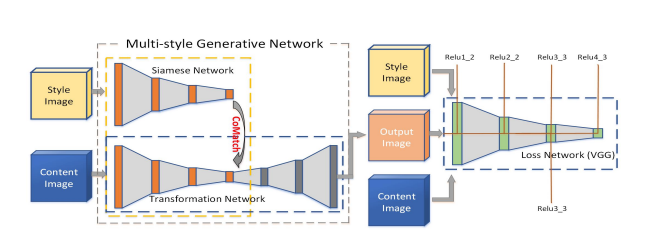

In [ ]:
import numpy as np
import torch
import torch.nn as nn
from torch.autograd import Variable


# define Gram Matrix
class GramMatrix(nn.Module):
    def forward(self, y):
        (b, ch, h, w) = y.size()
        features = y.view(b, ch, w * h)
        features_t = features.transpose(1, 2)
        gram = features.bmm(features_t) / (ch * h * w)
        return gram


# proposed Inspiration(CoMatch) Layer
class Inspiration(nn.Module):
    """Inspiration Layer (from MSG-Net paper)
    tuning the featuremap with target Gram Matrix
    ref https://arxiv.org/abs/1703.06953
    """

    def __init__(self, C, B=1):
        super(Inspiration, self).__init__()
        # B is equal to 1 or input mini_batch
        self.weight = nn.Parameter(torch.Tensor(1, C, C), requires_grad=True)
        # non-parameter buffer
        self.G = Variable(torch.Tensor(B, C, C), requires_grad=True)
        self.C = C
        self.reset_parameters()

    def reset_parameters(self):
        self.weight.data.uniform_(0.0, 0.02)

    def setTarget(self, target):
        self.G = target

    def forward(self, X):
        # input X is a 3D feature map
        self.P = torch.bmm(self.weight.expand_as(self.G), self.G)
        return torch.bmm(
            self.P.transpose(1, 2).expand(X.size(0), self.C, self.C),
            X.view(X.size(0), X.size(1), -1),
        ).view_as(X)

    def __repr__(self):
        return self.__class__.__name__ + "(" + "N x " + str(self.C) + ")"


# some basic layers, with reflectance padding
class ConvLayer(torch.nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride):
        super(ConvLayer, self).__init__()
        reflection_padding = kernel_size // 2
        self.reflection_pad = nn.ReflectionPad2d(reflection_padding)
        self.conv2d = nn.Conv2d(in_channels, out_channels, kernel_size, stride)

    def forward(self, x):
        out = self.reflection_pad(x)
        out = self.conv2d(out)
        return out


class UpsampleConvLayer(torch.nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, upsample=None):
        super(UpsampleConvLayer, self).__init__()
        self.upsample = upsample
        if upsample:
            self.upsample_layer = torch.nn.Upsample(scale_factor=upsample)
        self.reflection_padding = kernel_size // 2
        if self.reflection_padding != 0:
            self.reflection_pad = nn.ReflectionPad2d(self.reflection_padding)
        self.conv2d = nn.Conv2d(in_channels, out_channels, kernel_size, stride)

    def forward(self, x):
        if self.upsample:
            x = self.upsample_layer(x)
        if self.reflection_padding != 0:
            x = self.reflection_pad(x)
        out = self.conv2d(x)
        return out


class Bottleneck(nn.Module):
    """Pre-activation residual block
    Identity Mapping in Deep Residual Networks
    ref https://arxiv.org/abs/1603.05027
    """

    def __init__(
        self, inplanes, planes, stride=1, downsample=None, norm_layer=nn.BatchNorm2d
    ):
        super(Bottleneck, self).__init__()
        self.expansion = 4
        self.downsample = downsample
        if self.downsample is not None:
            self.residual_layer = nn.Conv2d(
                inplanes, planes * self.expansion, kernel_size=1, stride=stride
            )
        conv_block = []
        conv_block += [
            norm_layer(inplanes),
            nn.ReLU(inplace=True),
            nn.Conv2d(inplanes, planes, kernel_size=1, stride=1),
        ]
        conv_block += [
            norm_layer(planes),
            nn.ReLU(inplace=True),
            ConvLayer(planes, planes, kernel_size=3, stride=stride),
        ]
        conv_block += [
            norm_layer(planes),
            nn.ReLU(inplace=True),
            nn.Conv2d(planes, planes * self.expansion, kernel_size=1, stride=1),
        ]
        self.conv_block = nn.Sequential(*conv_block)

    def forward(self, x):
        if self.downsample is not None:
            residual = self.residual_layer(x)
        else:
            residual = x
        return residual + self.conv_block(x)


class UpBottleneck(nn.Module):
    """Up-sample residual block (from MSG-Net paper)
    Enables passing identity all the way through the generator
    ref https://arxiv.org/abs/1703.06953
    """

    def __init__(self, inplanes, planes, stride=2, norm_layer=nn.BatchNorm2d):
        super(UpBottleneck, self).__init__()
        self.expansion = 4
        self.residual_layer = UpsampleConvLayer(
            inplanes, planes * self.expansion, kernel_size=1, stride=1, upsample=stride
        )
        conv_block = []
        conv_block += [
            norm_layer(inplanes),
            nn.ReLU(inplace=True),
            nn.Conv2d(inplanes, planes, kernel_size=1, stride=1),
        ]
        conv_block += [
            norm_layer(planes),
            nn.ReLU(inplace=True),
            UpsampleConvLayer(planes, planes, kernel_size=3, stride=1, upsample=stride),
        ]
        conv_block += [
            norm_layer(planes),
            nn.ReLU(inplace=True),
            nn.Conv2d(planes, planes * self.expansion, kernel_size=1, stride=1),
        ]
        self.conv_block = nn.Sequential(*conv_block)

    def forward(self, x):
        return self.residual_layer(x) + self.conv_block(x)


# the MSG-Net
class Net(nn.Module):
    def __init__(
        self,
        input_nc=3,
        output_nc=3,
        ngf=64,
        norm_layer=nn.InstanceNorm2d,
        n_blocks=6,
        gpu_ids=[],
    ):
        super(Net, self).__init__()
        self.gpu_ids = gpu_ids
        self.gram = GramMatrix()

        block = Bottleneck
        upblock = UpBottleneck
        expansion = 4

        model1 = []
        model1 += [
            ConvLayer(input_nc, 64, kernel_size=7, stride=1),
            norm_layer(64),
            nn.ReLU(inplace=True),
            block(64, 32, 2, 1, norm_layer),
            block(32 * expansion, ngf, 2, 1, norm_layer),
        ]
        self.model1 = nn.Sequential(*model1)

        model = []
        self.ins = Inspiration(ngf * expansion)
        model += [self.model1]
        model += [self.ins]

        for i in range(n_blocks):
            model += [block(ngf * expansion, ngf, 1, None, norm_layer)]

        model += [
            upblock(ngf * expansion, 32, 2, norm_layer),
            upblock(32 * expansion, 16, 2, norm_layer),
            norm_layer(16 * expansion),
            nn.ReLU(inplace=True),
            ConvLayer(16 * expansion, output_nc, kernel_size=7, stride=1),
        ]

        self.model = nn.Sequential(*model)

    def setTarget(self, Xs):
        f = self.model1(Xs)
        G = self.gram(f)
        self.ins.setTarget(G)

    def forward(self, input):
        return self.model(input)


In [ ]:
from PIL import Image


def tensor_load_rgbimage(filename, size=None, scale=None, keep_asp=False):
    img = Image.open(filename).convert("RGB")
    if size is not None:
        if keep_asp:
            size2 = int(size * 1.0 / img.size[0] * img.size[1])
            img = img.resize((size, size2), Image.ANTIALIAS)
        else:
            img = img.resize((size, size), Image.ANTIALIAS)

    elif scale is not None:
        img = img.resize(
            (int(img.size[0] / scale), int(img.size[1] / scale)), Image.ANTIALIAS
        )
    img = np.array(img).transpose(2, 0, 1)
    img = torch.from_numpy(img).float()
    return img


def tensor_save_rgbimage(tensor, filename, cuda=False):
    if cuda:
        img = tensor.clone().cpu().clamp(0, 255).numpy()
    else:
        img = tensor.clone().clamp(0, 255).numpy()
    img = img.transpose(1, 2, 0).astype("uint8")
    img = Image.fromarray(img)
    img.save(filename)


def tensor_save_bgrimage(tensor, filename, cuda=False):
    (b, g, r) = torch.chunk(tensor, 3)
    tensor = torch.cat((r, g, b))
    tensor_save_rgbimage(tensor, filename, cuda)


def preprocess_batch(batch):
    batch = batch.transpose(0, 1)
    (r, g, b) = torch.chunk(batch, 3)
    batch = torch.cat((b, g, r))
    batch = batch.transpose(0, 1)
    return batch


In [ ]:
!wget -q https://raw.githubusercontent.com/zhanghang1989/PyTorch-Multi-Style-Transfer/master/experiments/images/content/venice-boat.jpg
!wget -q https://raw.githubusercontent.com/zhanghang1989/PyTorch-Multi-Style-Transfer/master/experiments/images/9styles/candy.jpg
#!wget -q -O 21styles.model https://www.dropbox.com/s/2iz8orqqubrfrpo/21styles.model?dl=1

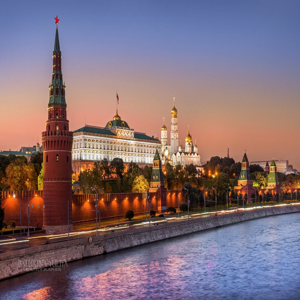

In [ ]:
display(Image.open('./kremlin.png').resize((300, 300)))

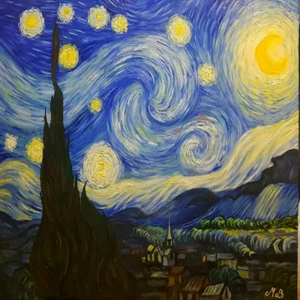

In [ ]:
display(Image.open('./van-gogh.png').resize((300, 300)))

In [ ]:
content_image = tensor_load_rgbimage('./kremlin.png', 
                                     size=512,
                                     keep_asp=True).unsqueeze(0)
style = tensor_load_rgbimage('./van-gogh.png', size=512).unsqueeze(0)
style = preprocess_batch(style)

style_model = Net(ngf=128)
model_dict = torch.load('21styles.model')
model_dict_clone = model_dict.copy()
for key, value in model_dict_clone.items():
    if key.endswith(('running_mean', 'running_var')):
        del model_dict[key]
style_model.load_state_dict(model_dict, False)

<All keys matched successfully>

In [ ]:
style_v = Variable(style)
content_image = Variable(preprocess_batch(content_image))
style_model.setTarget(style_v)
output = style_model(content_image)
tensor_save_bgrimage(output.data[0], 'output.png', False)

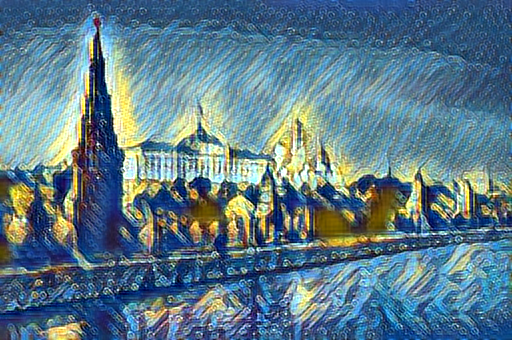

In [ ]:
display(Image.open('output.png'))